## Hclustering model

In [1]:
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from scipy.cluster.hierarchy import linkage 
import warnings
warnings.filterwarnings('ignore')
from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN

In [2]:

airline=pd.read_excel('EastWestAirlines.xlsx', sheet_name='data')
airline

,ID#,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?
0,1,28143,0,1,1,1,174,1,0,0,7000,0
1,2,19244,0,1,1,1,215,2,0,0,6968,0
2,3,41354,0,1,1,1,4123,4,0,0,7034,0
3,4,14776,0,1,1,1,500,1,0,0,6952,0
4,5,97752,0,4,1,1,43300,26,2077,4,6935,1
...,...,...,...,...,...,...,...,...,...,...,...,...
3994,4017,18476,0,1,1,1,8525,4,200,1,1403,1
3995,4018,64385,0,1,1,1,981,5,0,0,1395,1
3996,4019,73597,0,3,1,1,25447,8,0,0,1402,1
3997,4020,54899,0,1,1,1,500,1,500,1,1401,0


In [3]:
airline

,ID#,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?
0,1,28143,0,1,1,1,174,1,0,0,7000,0
1,2,19244,0,1,1,1,215,2,0,0,6968,0
2,3,41354,0,1,1,1,4123,4,0,0,7034,0
3,4,14776,0,1,1,1,500,1,0,0,6952,0
4,5,97752,0,4,1,1,43300,26,2077,4,6935,1
...,...,...,...,...,...,...,...,...,...,...,...,...
3994,4017,18476,0,1,1,1,8525,4,200,1,1403,1
3995,4018,64385,0,1,1,1,981,5,0,0,1395,1
3996,4019,73597,0,3,1,1,25447,8,0,0,1402,1
3997,4020,54899,0,1,1,1,500,1,500,1,1401,0


In [4]:
airline=airline.drop(['ID#'], axis=1)
airline

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?
0,28143,0,1,1,1,174,1,0,0,7000,0
1,19244,0,1,1,1,215,2,0,0,6968,0
2,41354,0,1,1,1,4123,4,0,0,7034,0
3,14776,0,1,1,1,500,1,0,0,6952,0
4,97752,0,4,1,1,43300,26,2077,4,6935,1
...,...,...,...,...,...,...,...,...,...,...,...
3994,18476,0,1,1,1,8525,4,200,1,1403,1
3995,64385,0,1,1,1,981,5,0,0,1395,1
3996,73597,0,3,1,1,25447,8,0,0,1402,1
3997,54899,0,1,1,1,500,1,500,1,1401,0


In [5]:
trans= MinMaxScaler()
data=pd.DataFrame(trans.fit_transform(airline.iloc[:,:]))

In [6]:
data

,0,1,2,3,4,5,6,7,8,9,10
0,0.016508,0.0,0.00,0.0,0.0,0.000660,0.011628,0.000000,0.000000,0.843742,0.0
1,0.011288,0.0,0.00,0.0,0.0,0.000815,0.023256,0.000000,0.000000,0.839884,0.0
2,0.024257,0.0,0.00,0.0,0.0,0.015636,0.046512,0.000000,0.000000,0.847842,0.0
3,0.008667,0.0,0.00,0.0,0.0,0.001896,0.011628,0.000000,0.000000,0.837955,0.0
4,0.057338,0.0,0.75,0.0,0.0,0.164211,0.302326,0.067398,0.075472,0.835905,1.0
...,...,...,...,...,...,...,...,...,...,...,...
3994,0.010837,0.0,0.00,0.0,0.0,0.032330,0.046512,0.006490,0.018868,0.168917,1.0
3995,0.037766,0.0,0.00,0.0,0.0,0.003720,0.058140,0.000000,0.000000,0.167953,1.0
3996,0.043169,0.0,0.50,0.0,0.0,0.096505,0.093023,0.000000,0.000000,0.168797,1.0
3997,0.032202,0.0,0.00,0.0,0.0,0.001896,0.011628,0.016225,0.018868,0.168676,0.0


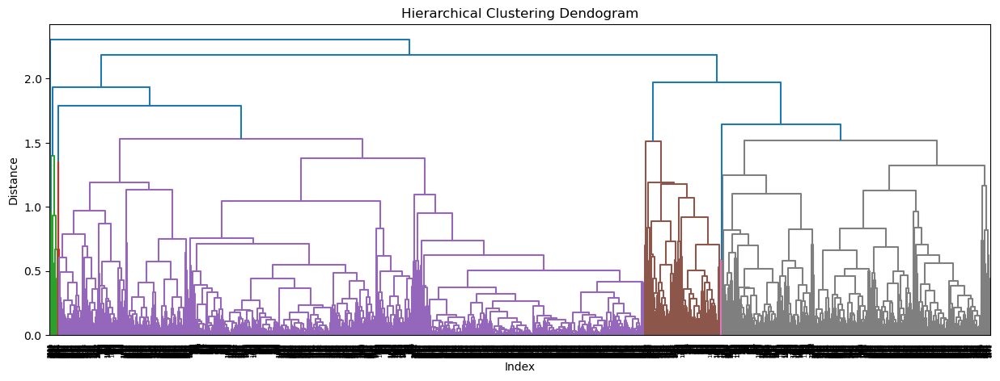

In [7]:
import scipy.cluster.hierarchy as sch
v=linkage(data,method='complete', metric='euclidean')
plt.figure(figsize=(15,5))
plt.title('Hierarchical Clustering Dendogram')
plt.xlabel('Index')
plt.ylabel('Distance')
sch.dendrogram(v)
plt.show()

In [8]:
from sklearn.cluster import AgglomerativeClustering
h_complete= AgglomerativeClustering(n_clusters=5, linkage='complete',affinity='euclidean').fit(data)
cluster_labels=pd.Series(h_complete.labels_)
cluster_labels
airline['clust']=cluster_labels 
airline

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?,clust
0,28143,0,1,1,1,174,1,0,0,7000,0,0
1,19244,0,1,1,1,215,2,0,0,6968,0,0
2,41354,0,1,1,1,4123,4,0,0,7034,0,0
3,14776,0,1,1,1,500,1,0,0,6952,0,0
4,97752,0,4,1,1,43300,26,2077,4,6935,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...
3994,18476,0,1,1,1,8525,4,200,1,1403,1,2
3995,64385,0,1,1,1,981,5,0,0,1395,1,2
3996,73597,0,3,1,1,25447,8,0,0,1402,1,2
3997,54899,0,1,1,1,500,1,500,1,1401,0,0


In [9]:
airline.iloc[:,:].groupby(airline.clust).mean()

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?
clust,,,,,,,,,,,
0,59968.433667,88.883768,1.712224,1.000401,1.011222,10271.530261,9.105812,227.797194,0.656112,3825.392786,0.000802
1,157084.578462,208.673846,4.661538,1.000000,1.061538,70477.086154,23.249231,1019.433846,3.196923,5770.572308,1.000000
2,80173.963287,248.550699,2.104895,1.009615,1.000874,16882.864510,13.412587,739.958916,2.236888,4304.383741,1.000000
3,131999.500000,347.000000,2.500000,1.000000,1.000000,65634.250000,69.250000,19960.000000,49.250000,2200.250000,1.000000
4,45515.064516,32.258065,1.000000,2.483871,1.000000,14618.870968,16.129032,443.225806,1.967742,3784.258065,0.193548


In [10]:
df= airline[(airline.clust==0)]
df

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?,clust
0,28143,0,1,1,1,174,1,0,0,7000,0,0
1,19244,0,1,1,1,215,2,0,0,6968,0,0
2,41354,0,1,1,1,4123,4,0,0,7034,0,0
3,14776,0,1,1,1,500,1,0,0,6952,0,0
5,16420,0,1,1,1,0,0,0,0,6942,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
3991,39142,0,3,1,1,14981,28,0,0,1408,0,0
3992,11181,0,1,1,1,929,12,0,0,1407,0,0
3993,3974,0,1,1,1,365,3,0,0,1397,0,0
3997,54899,0,1,1,1,500,1,500,1,1401,0,0


In [11]:
df=airline[(airline.clust==1)]
df

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?,clust
4,97752,0,4,1,1,43300,26,2077,4,6935,1,1
11,96522,0,5,1,1,61105,19,0,0,6924,1,1
15,28495,0,4,1,1,49442,15,0,0,6912,1,1
16,51890,0,4,1,1,48963,16,0,0,6910,1,1
20,120576,0,5,1,1,58831,23,250,2,6896,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...
3753,70178,0,5,1,1,61530,12,1300,6,3306,1,1
3772,822321,0,5,1,1,138334,26,600,2,3288,1,1
3846,97510,1678,5,1,1,71609,51,7650,26,1665,1,1
3855,190730,0,5,1,1,78916,28,2450,9,1648,1,1


In [12]:
df=airline[(airline.clust==2)]
df

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?,clust
7,20856,0,1,1,1,5250,4,250,1,6938,1,2
8,443003,0,3,2,1,1753,43,3850,12,6948,1,2
9,104860,0,3,1,1,28426,28,1150,3,6931,1,2
17,13958,0,1,1,1,4291,5,0,0,6905,1,2
18,91473,0,3,1,1,27408,17,0,0,6903,1,2
...,...,...,...,...,...,...,...,...,...,...,...,...
3987,11933,0,1,1,1,249,3,79,1,1412,1,2
3989,2622,0,1,1,1,1625,6,0,0,1404,1,2
3994,18476,0,1,1,1,8525,4,200,1,1403,1,2
3995,64385,0,1,1,1,981,5,0,0,1395,1,2


In [13]:
df=airline[(airline.clust==3)]
df

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?,clust
2015,53232,888,4,1,1,80696,65,22100,45,3831,1,3
3235,287033,0,1,1,1,26161,58,12873,53,2272,1,3
3583,160114,500,1,1,1,71954,86,30817,53,1373,1,3
3594,27619,0,4,1,1,83726,68,14050,46,1325,1,3


In [14]:
df=airline[(airline.clust==4)]
df

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?,clust
198,8669,0,1,3,1,11397,16,0,0,7486,1,4
381,167670,0,1,3,1,15907,13,0,0,6994,0,4
794,55610,0,1,2,1,5095,13,0,0,6151,0,4
940,44824,0,1,3,1,21107,19,2000,4,5916,1,4
1149,84856,0,1,2,1,6894,13,0,0,5547,0,4
1270,16103,0,1,3,1,10819,13,0,0,5427,0,4
1389,49145,0,1,2,1,12755,22,2450,7,5323,0,4
1527,23965,0,1,2,1,7308,16,550,3,5003,0,4
1541,36887,0,1,2,1,9048,11,0,0,4951,0,4
1791,32510,0,1,3,1,14568,13,0,0,4341,0,4


In [15]:
df= airline[(airline.clust==5)]
df

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?,clust


# hence we can take n_cluster= 5

In [16]:
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()
air=pd.DataFrame(scaler.fit_transform(airline.iloc[:, :]))
air

,0,1,2,3,4,5,6,7,8,9,10,11
0,-0.451141,-0.186299,-0.769578,-0.098242,-0.062767,-0.702786,-1.104065,-0.328603,-0.362168,1.395454,-0.766919,-0.730292
1,-0.539457,-0.186299,-0.769578,-0.098242,-0.062767,-0.701088,-0.999926,-0.328603,-0.362168,1.379957,-0.766919,-0.730292
2,-0.320031,-0.186299,-0.769578,-0.098242,-0.062767,-0.539253,-0.791649,-0.328603,-0.362168,1.411920,-0.766919,-0.730292
3,-0.583799,-0.186299,-0.769578,-0.098242,-0.062767,-0.689286,-1.104065,-0.328603,-0.362168,1.372208,-0.766919,-0.730292
4,0.239678,-0.186299,1.409471,-0.098242,-0.062767,1.083121,1.499394,1.154932,0.692490,1.363975,1.303918,0.332072
...,...,...,...,...,...,...,...,...,...,...,...,...
3994,-0.547079,-0.186299,-0.769578,-0.098242,-0.062767,-0.356960,-0.791649,-0.185750,-0.098503,-1.315120,1.303918,1.394435
3995,-0.091465,-0.186299,-0.769578,-0.098242,-0.062767,-0.669367,-0.687511,-0.328603,-0.362168,-1.318994,1.303918,1.394435
3996,-0.000043,-0.186299,0.683121,-0.098242,-0.062767,0.343804,-0.375096,-0.328603,-0.362168,-1.315604,1.303918,1.394435
3997,-0.185607,-0.186299,-0.769578,-0.098242,-0.062767,-0.689286,-1.104065,0.028531,-0.098503,-1.316088,-0.766919,-0.730292


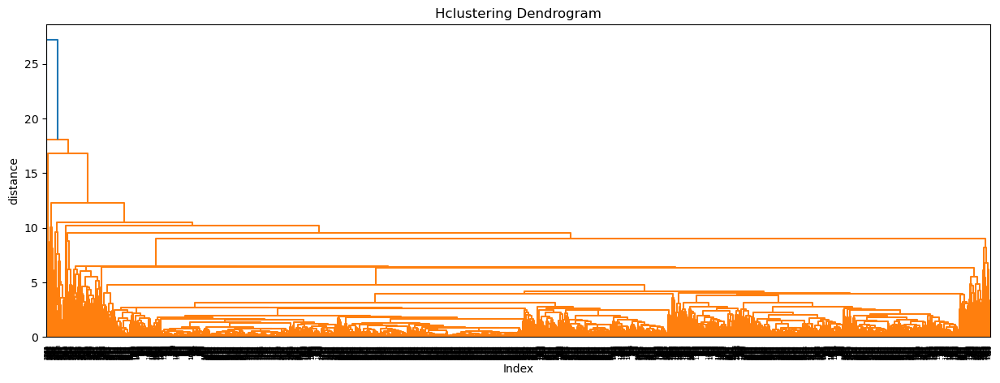

In [17]:
h=linkage(air, method='average', metric='euclidean')
plt.figure(figsize=(15,5))
plt.title('Hclustering Dendrogram')
plt.xlabel('Index')
plt.ylabel('distance')
sch.dendrogram(h)
plt.show()

In [28]:
h_complete=AgglomerativeClustering(n_clusters=5, linkage='average',affinity='euclidean').fit(air)
cluster_labels=pd.Series(h_complete.labels_)
cluster_labels
airline['clust']=cluster_labels # creating a  new column and assigning it to new column 
airline   

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?,clust
0,28143,0,1,1,1,174,1,0,0,7000,0,0
1,19244,0,1,1,1,215,2,0,0,6968,0,0
2,41354,0,1,1,1,4123,4,0,0,7034,0,0
3,14776,0,1,1,1,500,1,0,0,6952,0,0
4,97752,0,4,1,1,43300,26,2077,4,6935,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...
3994,18476,0,1,1,1,8525,4,200,1,1403,1,0
3995,64385,0,1,1,1,981,5,0,0,1395,1,0
3996,73597,0,3,1,1,25447,8,0,0,1402,1,0
3997,54899,0,1,1,1,500,1,500,1,1401,0,0


In [29]:
airline.iloc[:,:].groupby(airline.clust).mean()    

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?
clust,,,,,,,,,,,
0,7.247593e+04,140.5737,2.049975,1.014639,1.000757,16659.625946,11.357900,399.900050,1.217567,4116.182484,0.366229
1,1.623110e+05,883.9500,3.000000,1.000000,1.000000,52941.100000,42.850000,10605.950000,28.450000,4197.000000,1.000000
2,1.704838e+06,0.0000,1.000000,1.000000,1.000000,17108.000000,32.000000,4823.000000,23.000000,7283.000000,1.000000
3,1.601140e+05,500.0000,1.000000,1.000000,1.000000,71954.000000,86.000000,30817.000000,53.000000,1373.000000,1.000000
4,1.380614e+05,78.8000,3.466667,1.000000,4.066667,93927.866667,28.066667,506.666667,1.600000,4613.866667,0.533333


In [30]:
df=airline[(airline.clust==0)]
df

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?,clust
0,28143,0,1,1,1,174,1,0,0,7000,0,0
1,19244,0,1,1,1,215,2,0,0,6968,0,0
2,41354,0,1,1,1,4123,4,0,0,7034,0,0
3,14776,0,1,1,1,500,1,0,0,6952,0,0
4,97752,0,4,1,1,43300,26,2077,4,6935,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...
3994,18476,0,1,1,1,8525,4,200,1,1403,1,0
3995,64385,0,1,1,1,981,5,0,0,1395,1,0
3996,73597,0,3,1,1,25447,8,0,0,1402,1,0
3997,54899,0,1,1,1,500,1,500,1,1401,0,0


In [31]:
df=airline[(airline.clust==1)]
df

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?,clust
65,53914,0,3,1,1,33767,45,5550,29,6826,1,1
475,171509,0,3,1,1,40090,55,6381,23,8151,1,1
531,98472,1776,5,1,1,124421,45,10250,28,6621,1,1
622,62080,2975,2,1,1,19113,32,10650,28,6434,1,1
662,109532,0,5,1,1,128048,53,7939,26,6372,1,1
702,340874,0,5,1,1,68090,43,5676,27,6305,1,1
958,13375,4301,4,1,1,15732,43,9200,28,5916,1,1
1529,57857,1099,1,1,1,62650,37,12400,29,4996,1,1
1593,183370,0,1,1,1,30988,14,12988,9,4848,1,1
1676,51304,1362,1,1,1,11611,40,10075,36,4708,1,1


In [32]:
df=airline[(airline.clust==2)]
df

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?,clust
275,1704838,0,1,1,1,17108,32,4823,23,7283,1,2


In [33]:
df=airline[(airline.clust==3)]
df

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?,clust
3583,160114,500,1,1,1,71954,86,30817,53,1373,1,3


In [34]:
df=airline[(airline.clust==4)]
df

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?,clust
106,96627,1182,1,1,3,49059,26,2300,9,6738,1,4
384,28193,0,5,1,4,103456,32,0,0,6980,1,4
850,25629,0,4,1,5,107308,36,600,2,5966,1,4
904,15835,0,2,1,5,112171,16,0,0,5825,1,4
1036,154664,0,4,1,3,73881,33,0,0,5769,0,4
1244,166465,0,4,1,4,98717,30,0,0,5531,0,4
1300,737514,0,3,1,4,43993,40,2150,7,5030,0,4
1878,128302,0,5,1,4,132263,32,400,2,4103,1,4
1917,82981,0,5,1,3,105325,44,1000,2,3964,1,4
1946,126873,0,4,1,5,95598,32,500,1,3880,1,4


In [35]:
df=airline[(airline.clust==5)]
df

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?,clust


In [36]:
airline

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?,clust
0,28143,0,1,1,1,174,1,0,0,7000,0,0
1,19244,0,1,1,1,215,2,0,0,6968,0,0
2,41354,0,1,1,1,4123,4,0,0,7034,0,0
3,14776,0,1,1,1,500,1,0,0,6952,0,0
4,97752,0,4,1,1,43300,26,2077,4,6935,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...
3994,18476,0,1,1,1,8525,4,200,1,1403,1,0
3995,64385,0,1,1,1,981,5,0,0,1395,1,0
3996,73597,0,3,1,1,25447,8,0,0,1402,1,0
3997,54899,0,1,1,1,500,1,500,1,1401,0,0


 # k=5
 
 we can clearly observe that complete linkage method giving us better results to identify clusters than average method. 
 However due to more number of observation it is not possible by 'Hierarchycal clustering' model to get better results
 

## KMeans

In [37]:
air1=pd.read_excel('EastWestAirlines.xlsx', sheet_name='data')
air1

,ID#,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?
0,1,28143,0,1,1,1,174,1,0,0,7000,0
1,2,19244,0,1,1,1,215,2,0,0,6968,0
2,3,41354,0,1,1,1,4123,4,0,0,7034,0
3,4,14776,0,1,1,1,500,1,0,0,6952,0
4,5,97752,0,4,1,1,43300,26,2077,4,6935,1
...,...,...,...,...,...,...,...,...,...,...,...,...
3994,4017,18476,0,1,1,1,8525,4,200,1,1403,1
3995,4018,64385,0,1,1,1,981,5,0,0,1395,1
3996,4019,73597,0,3,1,1,25447,8,0,0,1402,1
3997,4020,54899,0,1,1,1,500,1,500,1,1401,0


In [38]:
air1=air1.drop(['ID#'],axis=1)

In [39]:
scaler=StandardScaler()
air2=pd.DataFrame(scaler.fit_transform(air1.iloc[:, :]))
air2

,0,1,2,3,4,5,6,7,8,9,10
0,-0.451141,-0.186299,-0.769578,-0.098242,-0.062767,-0.702786,-1.104065,-0.328603,-0.362168,1.395454,-0.766919
1,-0.539457,-0.186299,-0.769578,-0.098242,-0.062767,-0.701088,-0.999926,-0.328603,-0.362168,1.379957,-0.766919
2,-0.320031,-0.186299,-0.769578,-0.098242,-0.062767,-0.539253,-0.791649,-0.328603,-0.362168,1.411920,-0.766919
3,-0.583799,-0.186299,-0.769578,-0.098242,-0.062767,-0.689286,-1.104065,-0.328603,-0.362168,1.372208,-0.766919
4,0.239678,-0.186299,1.409471,-0.098242,-0.062767,1.083121,1.499394,1.154932,0.692490,1.363975,1.303918
...,...,...,...,...,...,...,...,...,...,...,...
3994,-0.547079,-0.186299,-0.769578,-0.098242,-0.062767,-0.356960,-0.791649,-0.185750,-0.098503,-1.315120,1.303918
3995,-0.091465,-0.186299,-0.769578,-0.098242,-0.062767,-0.669367,-0.687511,-0.328603,-0.362168,-1.318994,1.303918
3996,-0.000043,-0.186299,0.683121,-0.098242,-0.062767,0.343804,-0.375096,-0.328603,-0.362168,-1.315604,1.303918
3997,-0.185607,-0.186299,-0.769578,-0.098242,-0.062767,-0.689286,-1.104065,0.028531,-0.098503,-1.316088,-0.766919


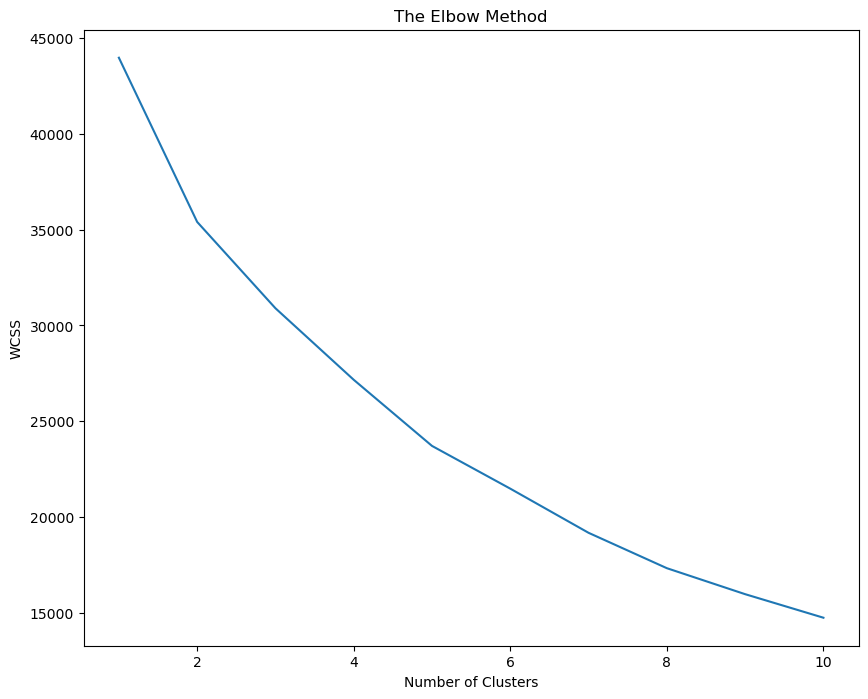

In [40]:
fig=plt.figure(figsize=(10,8))
WCSS=[]
for i in range(1,11):
    clf= KMeans(n_clusters=i)
    clf.fit(air2)
    WCSS.append(clf.inertia_)
plt.plot(range(1,11),WCSS)
plt.title('The Elbow Method')
plt.ylabel('WCSS')
plt.xlabel('Number of Clusters')
plt.show()  

In [36]:
clf=KMeans(n_clusters=6)
y_Kmeans=clf.fit_predict(air2)

In [37]:
y_Kmeans
clf.labels_

array([1, 1, 1, ..., 0, 0, 0])

In [38]:
y_Kmeans

array([1, 1, 1, ..., 0, 0, 0])

In [39]:
clf.cluster_centers_

array([[ 0.96798892, -0.33817895, -0.05991848, -0.50151495, -0.09824189,
        -0.06276658, -0.46155243, -0.41715591, -0.1840785 , -0.20411043,
        -0.95901333, -0.35774512],
       [-0.79196859, -0.1631385 , -0.05027996, -0.50980154, -0.09824189,
        -0.05874892, -0.47206239, -0.39200318, -0.16219106, -0.17522454,
         0.77073022, -0.25042807],
       [-0.39060765,  0.51405367,  0.02905894,  1.35920698, -0.09824189,
        -0.05278116,  1.12106793,  0.80036826, -0.06180176, -0.06689442,
         0.39294891,  0.68831833],
       [-0.30152248,  0.63971926, -0.08443292,  1.0220844 , -0.09824189,
        15.64629931,  3.17969131,  1.71461374,  0.03329269,  0.05969539,
         0.23987261,  0.33752735],
       [ 0.21932485, -0.04688966, -0.1562356 , -0.66822727,  9.03825361,
        -0.06276658, -0.10166533,  0.61785114,  0.0875494 ,  0.22034681,
        -0.07246398,  0.05178388],
       [-0.26933465,  1.21023242,  0.89615916,  0.1198295 , -0.09824189,
        -0.06276658,  

In [40]:
clf.inertia_

23491.108445281643

In [41]:
md=pd.Series(y_Kmeans) #converting numpy array into column 
air2['clust']=md #creating new column 
air2

,0,1,2,3,4,5,6,7,8,9,10,11,clust
0,-1.735125,-0.451141,-0.186299,-0.769578,-0.098242,-0.062767,-0.702786,-1.104065,-0.328603,-0.362168,1.395454,-0.766919,1
1,-1.734263,-0.539457,-0.186299,-0.769578,-0.098242,-0.062767,-0.701088,-0.999926,-0.328603,-0.362168,1.379957,-0.766919,1
2,-1.733402,-0.320031,-0.186299,-0.769578,-0.098242,-0.062767,-0.539253,-0.791649,-0.328603,-0.362168,1.411920,-0.766919,1
3,-1.732540,-0.583799,-0.186299,-0.769578,-0.098242,-0.062767,-0.689286,-1.104065,-0.328603,-0.362168,1.372208,-0.766919,1
4,-1.731679,0.239678,-0.186299,1.409471,-0.098242,-0.062767,1.083121,1.499394,1.154932,0.692490,1.363975,1.303918,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3994,1.725097,-0.547079,-0.186299,-0.769578,-0.098242,-0.062767,-0.356960,-0.791649,-0.185750,-0.098503,-1.315120,1.303918,0
3995,1.725958,-0.091465,-0.186299,-0.769578,-0.098242,-0.062767,-0.669367,-0.687511,-0.328603,-0.362168,-1.318994,1.303918,0
3996,1.726820,-0.000043,-0.186299,0.683121,-0.098242,-0.062767,0.343804,-0.375096,-0.328603,-0.362168,-1.315604,1.303918,0
3997,1.727682,-0.185607,-0.186299,-0.769578,-0.098242,-0.062767,-0.689286,-1.104065,0.028531,-0.098503,-1.316088,-0.766919,0


In [42]:
air2.iloc[:,:-1].groupby(air2.clust).mean()

,0,1,2,3,4,5,6,7,8,9,10,11
clust,,,,,,,,,,,,
0,0.967989,-0.338179,-0.059918,-0.501515,-0.098242,-0.062767,-0.461552,-0.417156,-0.184079,-0.204110,-0.959013,-0.357745
1,-0.791969,-0.163139,-0.050280,-0.509802,-0.098242,-0.058749,-0.472062,-0.392003,-0.162191,-0.175225,0.770730,-0.250428
2,-0.390608,0.514054,0.029059,1.359207,-0.098242,-0.052781,1.121068,0.800368,-0.061802,-0.066894,0.392949,0.688318
3,-0.301522,0.639719,-0.084433,1.022084,-0.098242,15.646299,3.179691,1.714614,0.033293,0.059695,0.239873,0.337527
4,0.219325,-0.046890,-0.156236,-0.668227,9.038254,-0.062767,-0.101665,0.617851,0.087549,0.220347,-0.072464,0.051784
5,-0.269335,1.210232,0.896159,0.119829,-0.098242,-0.062767,0.662843,1.694920,3.678690,3.989194,0.309375,0.951735


Text(0.5, 1.0, 'clusters using KMeans')

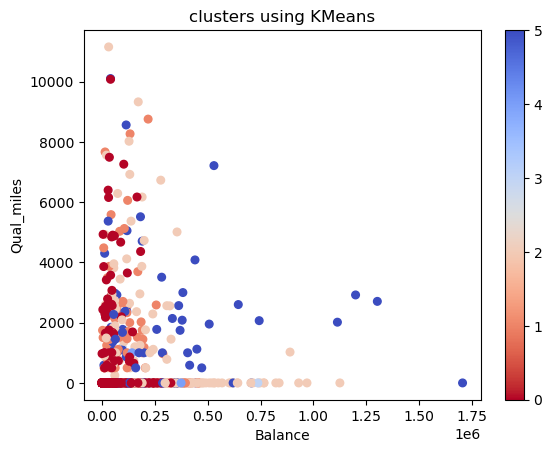

In [44]:
air1.plot(x='Balance', y='Qual_miles', c=clf.labels_,kind='scatter', s=30, cmap=plt.cm.coolwarm_r)
plt.title('clusters using KMeans')

In [45]:
WCSS

[47988.0,
 39018.76857091042,
 34529.25613539611,
 30616.623636092638,
 26894.77176046547,
 23490.742235699072,
 20922.66432522746,
 19331.46022838438,
 18020.638266550326,
 17028.904164646323]

let us try with diffrent 'K value' and see if we get better results

In [46]:
clf=KMeans(n_clusters=8)
ykmeans=clf.fit_predict(air2)

In [47]:
ykmeans
clf.labels_

array([1, 1, 1, ..., 2, 3, 3])

In [48]:
ykmeans

array([1, 1, 1, ..., 2, 3, 3])

In [49]:
clf.cluster_centers_

array([[ 4.25464160e-01,  7.09987688e+00,  9.59681956e-03,
        -9.82418871e-02, -6.27665798e-02,  1.10131291e-01,
         9.82601731e-02,  3.59263109e-01,  4.00062342e-01,
        -8.13235276e-02,  3.24976816e-01],
       [-1.38414986e-01, -1.43717877e-01, -4.04529545e-01,
        -9.82418871e-02, -5.74801800e-02, -4.49284222e-01,
        -3.21898393e-01, -2.02905302e-01, -2.21764462e-01,
         7.38621466e-01, -7.66919299e-01],
       [-1.53151141e-01, -5.83664081e-02, -2.64720468e-01,
        -9.82418871e-02, -6.27665798e-02, -2.71672161e-01,
        -1.03564877e-01, -2.74580340e-02, -2.07060165e-02,
         6.58849698e-02,  1.30391816e+00],
       [-3.87755253e-01, -1.44345997e-01, -5.88146828e-01,
        -9.82418871e-02, -6.27665798e-02, -5.28307335e-01,
        -5.21336656e-01, -2.21689246e-01, -2.43801729e-01,
        -9.75222109e-01, -7.66919299e-01],
       [ 1.24463396e+00,  4.86198029e-01,  2.36594659e-01,
        -9.82418871e-02, -6.27665798e-02,  8.04931022e-01,
  

In [50]:
clf.inertia_

17316.75360435649

In [51]:
md=pd.Series(ykmeans) #converting numpy array into column 
air2['clust']=md #creating new column 
air2

,0,1,2,3,4,5,6,7,8,9,10,clust
0,-0.451141,-0.186299,-0.769578,-0.098242,-0.062767,-0.702786,-1.104065,-0.328603,-0.362168,1.395454,-0.766919,1
1,-0.539457,-0.186299,-0.769578,-0.098242,-0.062767,-0.701088,-0.999926,-0.328603,-0.362168,1.379957,-0.766919,1
2,-0.320031,-0.186299,-0.769578,-0.098242,-0.062767,-0.539253,-0.791649,-0.328603,-0.362168,1.411920,-0.766919,1
3,-0.583799,-0.186299,-0.769578,-0.098242,-0.062767,-0.689286,-1.104065,-0.328603,-0.362168,1.372208,-0.766919,1
4,0.239678,-0.186299,1.409471,-0.098242,-0.062767,1.083121,1.499394,1.154932,0.692490,1.363975,1.303918,7
...,...,...,...,...,...,...,...,...,...,...,...,...
3994,-0.547079,-0.186299,-0.769578,-0.098242,-0.062767,-0.356960,-0.791649,-0.185750,-0.098503,-1.315120,1.303918,2
3995,-0.091465,-0.186299,-0.769578,-0.098242,-0.062767,-0.669367,-0.687511,-0.328603,-0.362168,-1.318994,1.303918,2
3996,-0.000043,-0.186299,0.683121,-0.098242,-0.062767,0.343804,-0.375096,-0.328603,-0.362168,-1.315604,1.303918,2
3997,-0.185607,-0.186299,-0.769578,-0.098242,-0.062767,-0.689286,-1.104065,0.028531,-0.098503,-1.316088,-0.766919,3


In [52]:
air2.iloc[:,:-1].groupby(air2.clust).mean()

,0,1,2,3,4,5,6,7,8,9,10
clust,,,,,,,,,,,
0,0.425464,7.099877,0.009597,-0.098242,-0.062767,0.110131,0.098260,0.359263,0.400062,-0.081324,0.324977
1,-0.138415,-0.143718,-0.404530,-0.098242,-0.057480,-0.449284,-0.321898,-0.202905,-0.221764,0.738621,-0.766919
2,-0.153151,-0.058366,-0.264720,-0.098242,-0.062767,-0.271672,-0.103565,-0.027458,-0.020706,0.065885,1.303918
3,-0.387755,-0.144346,-0.588147,-0.098242,-0.062767,-0.528307,-0.521337,-0.221689,-0.243802,-0.975222,-0.766919
4,1.244634,0.486198,0.236595,-0.098242,-0.062767,0.804931,1.899730,4.055359,4.303830,0.311922,0.930488
5,0.639719,-0.084433,1.022084,-0.098242,15.646299,3.179691,1.714614,0.033293,0.059695,0.239873,0.337527
6,-0.046890,-0.156236,-0.668227,9.038254,-0.062767,-0.101665,0.617851,0.087549,0.220347,-0.072464,0.051784
7,0.642788,-0.106247,1.555627,-0.098242,-0.050273,1.369886,0.870373,-0.050796,-0.050915,0.406072,0.538718


Text(0.5, 1.0, 'clusters using kmeans')

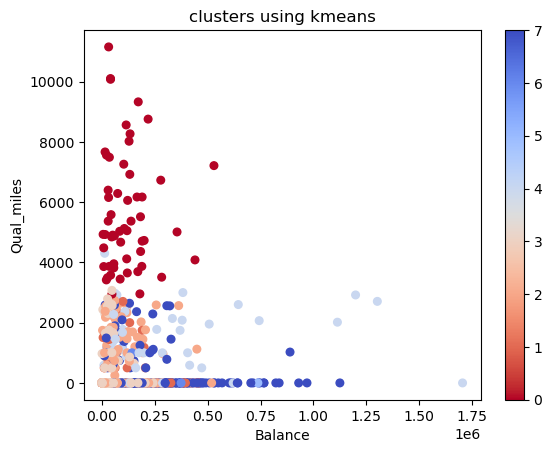

In [53]:
air1.plot(x='Balance', y='Qual_miles',c=clf.labels_,kind='scatter',s=30, cmap=plt.cm.coolwarm_r)
plt.title('clusters using kmeans')

## we can see diffrence by changing k=6 
# hence assume optimal kvalue=8

## DBSCAN

In [55]:
df= pd.read_excel('EastWestAirlines.xlsx', sheet_name='data')
df

,ID#,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?
0,1,28143,0,1,1,1,174,1,0,0,7000,0
1,2,19244,0,1,1,1,215,2,0,0,6968,0
2,3,41354,0,1,1,1,4123,4,0,0,7034,0
3,4,14776,0,1,1,1,500,1,0,0,6952,0
4,5,97752,0,4,1,1,43300,26,2077,4,6935,1
...,...,...,...,...,...,...,...,...,...,...,...,...
3994,4017,18476,0,1,1,1,8525,4,200,1,1403,1
3995,4018,64385,0,1,1,1,981,5,0,0,1395,1
3996,4019,73597,0,3,1,1,25447,8,0,0,1402,1
3997,4020,54899,0,1,1,1,500,1,500,1,1401,0


In [56]:
df=df.drop(['ID#'], axis=1)

In [57]:
array= df.values
array

array([[28143,     0,     1, ...,     0,  7000,     0],
       [19244,     0,     1, ...,     0,  6968,     0],
       [41354,     0,     1, ...,     0,  7034,     0],
       ...,
       [73597,     0,     3, ...,     0,  1402,     1],
       [54899,     0,     1, ...,     1,  1401,     0],
       [ 3016,     0,     1, ...,     0,  1398,     0]], dtype=int64)

In [58]:
stscaler=StandardScaler().fit(array)
x=stscaler.transform(array)
x

array([[-4.51140783e-01, -1.86298687e-01, -7.69578406e-01, ...,
        -3.62167870e-01,  1.39545434e+00, -7.66919299e-01],
       [-5.39456874e-01, -1.86298687e-01, -7.69578406e-01, ...,
        -3.62167870e-01,  1.37995704e+00, -7.66919299e-01],
       [-3.20031232e-01, -1.86298687e-01, -7.69578406e-01, ...,
        -3.62167870e-01,  1.41192021e+00, -7.66919299e-01],
       ...,
       [-4.29480975e-05, -1.86298687e-01,  6.83121167e-01, ...,
        -3.62167870e-01, -1.31560393e+00,  1.30391816e+00],
       [-1.85606976e-01, -1.86298687e-01, -7.69578406e-01, ...,
        -9.85033311e-02, -1.31608822e+00, -7.66919299e-01],
       [-7.00507951e-01, -1.86298687e-01, -7.69578406e-01, ...,
        -3.62167870e-01, -1.31754109e+00, -7.66919299e-01]])

In [89]:
from sklearn.neighbors import NearestNeighbors
neigh= NearestNeighbors(n_neighbors=22)
nbrs=neigh.fit(x)
distance, indices=nbrs.kneighbors(x)

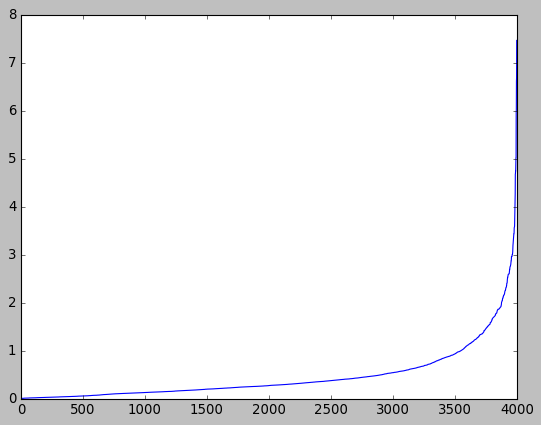

In [90]:
distance= np.sort(distance, axis=0)
distance= distance[:,1]
plt.plot(distance)

so by looking at the graph we can assume 'eps= 1.95'

In [91]:
dbscan= DBSCAN(eps=1.95, min_samples=12)
dbscan.fit(x)

DBSCAN(eps=1.95, min_samples=12)

In [92]:
dbscan.labels_

array([0, 0, 0, ..., 1, 0, 0], dtype=int64)

In [93]:
cl=pd.DataFrame(dbscan.labels_,columns=['cluster'])   

In [94]:
cl
pd.set_option('display.max_rows', None)

In [95]:
cl

,cluster
0,0
1,0
2,0
3,0
4,1
5,0
6,0
7,1
8,-1
9,1


In [96]:
df1=pd.concat([df,cl], axis=1)
df1

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?,cluster
0,28143,0,1,1,1,174,1,0,0,7000,0,0
1,19244,0,1,1,1,215,2,0,0,6968,0,0
2,41354,0,1,1,1,4123,4,0,0,7034,0,0
3,14776,0,1,1,1,500,1,0,0,6952,0,0
4,97752,0,4,1,1,43300,26,2077,4,6935,1,1
5,16420,0,1,1,1,0,0,0,0,6942,0,0
6,84914,0,3,1,1,27482,25,0,0,6994,0,0
7,20856,0,1,1,1,5250,4,250,1,6938,1,1
8,443003,0,3,2,1,1753,43,3850,12,6948,1,-1
9,104860,0,3,1,1,28426,28,1150,3,6931,1,1


In [97]:
plt.style.use('classic')

Text(0.5, 1.0, 'cluster using DBSCAN')

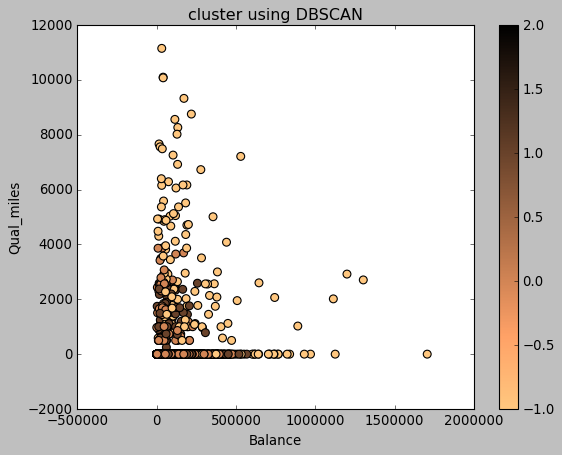

In [98]:
df1.plot(x='Balance',y='Qual_miles', c=dbscan.labels_, kind='scatter', s=50, cmap=plt.cm.copper_r)
plt.title('cluster using DBSCAN')

In [99]:
dl= dbscan.labels_

In [100]:
import sklearn
sklearn.metrics.silhouette_score(x,dl)

0.2547057370634093

In [101]:
dbscan= DBSCAN(eps=2.2, min_samples=12)
dbscan.fit(x)

DBSCAN(eps=2.2, min_samples=12)

In [102]:
dbscan.labels_

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [103]:
cl=pd.DataFrame(dbscan.labels_,columns=['cluster'])   

In [104]:
cl
pd.set_option('display.max_rows', None)

In [105]:
cl

,cluster
0,0
1,0
2,0
3,0
4,0
5,0
6,0
7,0
8,-1
9,0


In [106]:
df1=pd.concat([df,cl], axis=1)
df1

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?,cluster
0,28143,0,1,1,1,174,1,0,0,7000,0,0
1,19244,0,1,1,1,215,2,0,0,6968,0,0
2,41354,0,1,1,1,4123,4,0,0,7034,0,0
3,14776,0,1,1,1,500,1,0,0,6952,0,0
4,97752,0,4,1,1,43300,26,2077,4,6935,1,0
5,16420,0,1,1,1,0,0,0,0,6942,0,0
6,84914,0,3,1,1,27482,25,0,0,6994,0,0
7,20856,0,1,1,1,5250,4,250,1,6938,1,0
8,443003,0,3,2,1,1753,43,3850,12,6948,1,-1
9,104860,0,3,1,1,28426,28,1150,3,6931,1,0


Text(0.5, 1.0, 'cluster using DBSCAN')

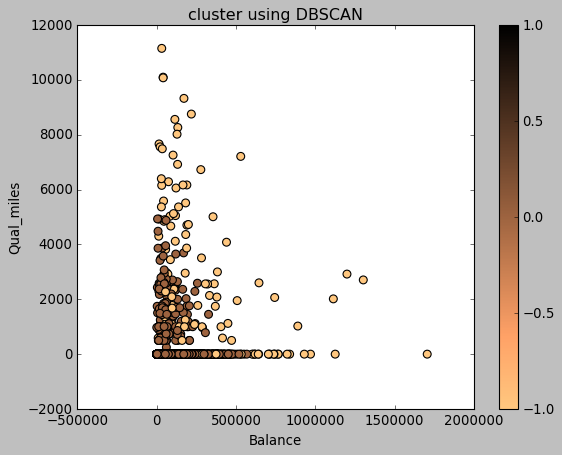

In [107]:
df1.plot(x='Balance',y='Qual_miles', c=dbscan.labels_, kind='scatter', s=50, cmap=plt.cm.copper_r)
plt.title('cluster using DBSCAN')

In [108]:
dl=dbscan.labels_

In [109]:
sklearn.metrics.silhouette_score(x,dl)

0.5374496099810585

In [118]:
dbscan= DBSCAN(eps=2.25, min_samples=12)
dbscan.fit(x)

DBSCAN(eps=2.25, min_samples=12)

In [119]:
dbscan.labels_

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [120]:
cl=pd.DataFrame(dbscan.labels_,columns=['cluster'])   

In [121]:
cl
pd.set_option('display.max_rows', None)

In [122]:
cl

,cluster
0,0
1,0
2,0
3,0
4,0
5,0
6,0
7,0
8,-1
9,0


In [123]:
df1=pd.concat([df,cl], axis=1)
df1

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?,cluster
0,28143,0,1,1,1,174,1,0,0,7000,0,0
1,19244,0,1,1,1,215,2,0,0,6968,0,0
2,41354,0,1,1,1,4123,4,0,0,7034,0,0
3,14776,0,1,1,1,500,1,0,0,6952,0,0
4,97752,0,4,1,1,43300,26,2077,4,6935,1,0
5,16420,0,1,1,1,0,0,0,0,6942,0,0
6,84914,0,3,1,1,27482,25,0,0,6994,0,0
7,20856,0,1,1,1,5250,4,250,1,6938,1,0
8,443003,0,3,2,1,1753,43,3850,12,6948,1,-1
9,104860,0,3,1,1,28426,28,1150,3,6931,1,0


Text(0.5, 1.0, 'cluster using DBSCAN')

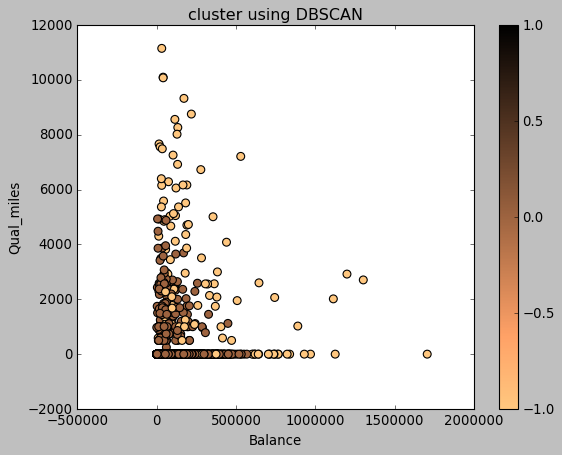

In [124]:
df1.plot(x='Balance',y='Qual_miles', c=dbscan.labels_, kind='scatter', s=50, cmap=plt.cm.copper_r)
plt.title('cluster using DBSCAN')

In [125]:
dl=dbscan.labels_

In [126]:
sklearn.metrics.silhouette_score(x,dl)

0.5382380078166649

# hence we accept eps=2.25 and min_points=13